# impoer all

In [1]:
'/home/hmf/work/FA_test/nb/check_focalplane.py'
import sys
from fiberassign.hardware import load_hardware
from fiberassign.assign import read_assignment_fits_tile
from test_MUST_fp import *
import os
os.environ["DESIMODEL"] = os.path.expanduser("~/work/FA_test/desi")
print(os.environ["DESIMODEL"])
from fiberassign.hardware import radec2xy
import sys
from fiberassign.hardware import load_hardware
from fiberassign.assign import read_assignment_fits_tile



# infile = '/home/hmf/work/FA_test/output/MUST_FP_test/iter00000001.fits'

# header, fiber_data, targets_data, avail_data, gfa_data = \
#         read_assignment_fits_tile(infile)
# tile_id = int(header["TILEID"])
# tile_ra = float(header["TILERA"])
# tile_dec = float(header["TILEDEC"])
# print(tile_id, tile_ra, tile_dec)
# tile_theta = float(header["FIELDROT"])
# tile_obstime = header["FA_PLAN"]
# tile_obsha = float(header["FA_HA"])
# tile_obsha = float(header["FA_HA"])
# run_date = header["FA_RUN"]
# margins = {}
# for key in ['pos', 'gfa', 'module']:
#     hdrkey = "FA_M_%s" % key[:3]
#     if hdrkey in header:
#         margins[key] = header[hdrkey]
# # load hardware
# hw = load_hardware(rundate=run_date, add_margins=margins)


/home/hmf/work/FA_test/desi


In [2]:
hw = load_hardware(rundate = '2026-04-15T17:15:00+00:00')

Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
state["LOCATION"]: LOCATION
--------
    8000
    8001
    8002
    8003
    8004
    8005
    8006
    8007
    8008
    8009
     ...
  375053
  375054
  375055
  375056
  375057
  375058
  375059
  375060
  375061
  375062
Length = 21168 rows
INFO: Focalplane has 0 fibers that are stuck or broken


In [ ]:
hw = load_hardware(rundate = '2026-04-13T13:23:00+00:00')#(rundate='2026-04-15T17:15:00+00:00')

INFO: Loaded focalplane for time stamp 2026-04-13 13:23:00+00:00
state["LOCATION"]: LOCATION
--------
       0
       1
       2
       3
       4
       5
       6
       7
       8
       9
     ...
  335053
  335054
  335055
  335056
  335057
  335058
  335059
  335060
  335061
  335062
Length = 21168 rows
dict_keys([np.int32(0), np.int32(1), np.int32(2), np.int32(3), np.int32(4), np.int32(5), np.int32(6), np.int32(7), np.int32(8), np.int32(9), np.int32(10), np.int32(11), np.int32(12), np.int32(13), np.int32(14), np.int32(15), np.int32(16), np.int32(17), np.int32(18), np.int32(19), np.int32(20), np.int32(21), np.int32(22), np.int32(23), np.int32(24), np.int32(25), np.int32(26), np.int32(27), np.int32(28), np.int32(29), np.int32(30), np.int32(31), np.int32(32), np.int32(33), np.int32(34), np.int32(35), np.int32(36), np.int32(37), np.int32(38), np.int32(39), np.int32(40), np.int32(41), np.int32(42), np.int32(43), np.int32(44), np.int32(45), np.int32(46), np.int32(47), np.int32(48), np

In [3]:

import os
os.environ["DESIMODEL"] = os.path.expanduser("~/work/FA_test/desi")
print(os.environ["DESIMODEL"])
import subprocess
import numpy as np
from astropy.table import Table
import sys
sys.path.append('/home/hmf/work/FA_test/nb/')
from test_MUST_fp import *


def fba_int_run(target_init, output_dir, footprint, n_iter, run_time, of_base):
    current_target = target_init
    for i in range(n_iter):
        print(f"\n========== Iteration {i} ==========")

        prefix = f"iter{i:02d}"

        # 1. 跑 fba
        try:
            run_fba(current_target, footprint, output_dir, run_time, prefix)

            # 2. 找输出文件
            fba_file = find_fba_file(prefix, output_dir)
            print(f"  Using fba file: {fba_file}")

            # 3. 读取分配结果
            assigned_ids = get_assigned_ids(fba_file)

            # 4. 生成新 target 文件
            res_target = f"{of_base}_a{i+1}_tar{{}}.fits"
            ofname = update_target(current_target, assigned_ids, res_target)

            # 5. 更新
            current_target = ofname
            # print('residual target:', n_tar)
            # if n_tar==0:
            #     exit()
        except:
            print(i)
for run_time in [ '2026-04-15T17:15:00+00:00','2026-04-15T17:10:00+00:00']:#,#['2026-04-13T13:23:00+00:00']:#
    for n_target in [ 4000, 6000, 8000, 10000]:
        target_init = f"/home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_{n_target:.1f}.fits"
        footprint = "/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits"
        # run_time = '2026-04-13T13:23:00+00:00'
        # run_time = '2026-04-15T16:37:00+00:00'#/home/hmf/work/FA_test/desi/data/focalplane/must-focalplane_2026-04-15T16:37:00+00:00.ecsv
        # run_time = '2026-04-15T17:10:00+00:00'# /home/hmf/work/FA_test/desi/data/focalplane/must-focalplane_2026-04-15T17:10:00+00:00.ecsv
        # run_time = '2026-04-15T17:15:00+00:00'

        output_dir = f"/home/hmf/work/FA_test/output/MUST_FP_test/{run_time}/{os.path.basename(target_init).replace('.fits', '')}"
        if not os.path.exists(output_dir):
            print(f"Output directory {output_dir} already exists. Please remove it or choose a different name.")
            os.makedirs(output_dir)


        n_iter = 10
        fba_int_run(target_init, output_dir, footprint, n_iter, run_time, output_dir)


/home/hmf/work/FA_test/desi

========== Iteration 0 ==========
fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_4000.0.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter00

[RUN] fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_4000.0.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter00


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_4000.0.fits has 397972 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_4000.0.fits:  0.30 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 22278 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.10 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.05 seconds (1 cal

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a1_tar386661.fits has 386661 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a1_tar386661.fits:  0.28 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 10967 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.07 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a2_tar382678.fits has 382678 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a2_tar382678.fits:  0.28 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 6984 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a3_tar381756.fits has 381756 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a3_tar381756.fits:  0.28 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 6062 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.05 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a4_tar381607.fits has 381607 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a4_tar381607.fits:  0.29 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 5913 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.10 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a5_tar381583.fits has 381583 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a5_tar381583.fits:  0.28 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 5889 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.07 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits has 381582 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits:  0.28 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 5888 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 212, in write_assignment_fits_

6

========== Iteration 7 ==========
fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter07

[RUN] fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter07


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits has 381582 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits:  0.28 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 5888 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.07 seco

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

7

========== Iteration 8 ==========
fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter08

[RUN] fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter08


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits has 381582 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits:  0.29 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 5888 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

8

========== Iteration 9 ==========
fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter09

[RUN] fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter09


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits has 381582 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381582.fits:  0.29 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 5888 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.05 seco

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

9
Output directory /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0 already exists. Please remove it or choose a different name.

========== Iteration 0 ==========
fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_6000.0.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter00

[RUN] fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_6000.0.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0 --overwrite --sky_per_module 1 --standards_per_modu

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_6000.0.fits has 596958 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_6000.0.fits:  0.47 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 33304 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.12 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.03 seconds (1 cal

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a1_tar582758.fits has 582758 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a1_tar582758.fits:  0.46 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 19104 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.08 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a2_tar575809.fits has 575809 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a2_tar575809.fits:  0.45 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12155 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a3_tar573462.fits has 573462 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a3_tar573462.fits:  0.45 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9808 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a4_tar572824.fits has 572824 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a4_tar572824.fits:  0.44 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9170 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a5_tar572699.fits has 572699 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a5_tar572699.fits:  0.47 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9045 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.07 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572681.fits has 572681 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572681.fits:  0.45 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9027 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.05 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572681.fits has 572681 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572681.fits:  0.46 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9027 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572681.fits has 572681 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572681.fits:  0.45 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9027 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572681.fits has 572681 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572681.fits:  0.44 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9027 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_8000.0.fits has 795945 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_8000.0.fits:  0.68 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 44360 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.13 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.12 seconds (1 cal

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a1_tar779612.fits has 779612 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a1_tar779612.fits:  0.64 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 28027 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.10 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a2_tar769950.fits has 769950 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a2_tar769950.fits:  0.64 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 18365 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.08 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a3_tar765617.fits has 765617 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a3_tar765617.fits:  0.62 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 14032 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a4_tar764134.fits has 764134 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a4_tar764134.fits:  0.62 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12549 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a5_tar763770.fits has 763770 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a5_tar763770.fits:  0.64 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12185 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a6_tar763673.fits has 763673 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a6_tar763673.fits:  0.63 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12088 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a7_tar763649.fits has 763649 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a7_tar763649.fits:  0.63 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12064 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a8_tar763640.fits has 763640 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a8_tar763640.fits:  0.63 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12055 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 sec

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

8

========== Iteration 9 ==========
fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a8_tar763640.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter09

[RUN] fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a8_tar763640.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter09


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a8_tar763640.fits has 763640 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_8000.0_a8_tar763640.fits:  0.63 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12055 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 sec

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

9
Output directory /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0 already exists. Please remove it or choose a different name.

========== Iteration 0 ==========
fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_10000.0.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter00

[RUN] fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_10000.0.fits --rundate 2026-04-15T17:15:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0 --overwrite --sky_per_module 1 --standards_per

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_10000.0.fits has 994931 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_10000.0.fits:  0.99 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 55215 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.15 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.06 seconds (1 c

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a1_tar977121.fits has 977121 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a1_tar977121.fits:  0.84 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 37405 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.11 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a2_tar964992.fits has 964992 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a2_tar964992.fits:  0.83 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 25276 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.09 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a3_tar958591.fits has 958591 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a3_tar958591.fits:  0.82 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 18875 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.07 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a4_tar955899.fits has 955899 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a4_tar955899.fits:  0.81 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 16183 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.08 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a5_tar955015.fits has 955015 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a5_tar955015.fits:  0.82 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 15299 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a6_tar954754.fits has 954754 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a6_tar954754.fits:  0.81 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 15038 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a7_tar954691.fits has 954691 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a7_tar954691.fits:  0.81 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 14975 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a8_tar954680.fits has 954680 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a8_tar954680.fits:  0.82 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 14964 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:15:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a9_tar954678.fits has 954678 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:15:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:15:00+00:00/targets_exdense_box10.000_00_10000.0_a9_tar954678.fits:  0.80 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 14962 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 s

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

9

========== Iteration 0 ==========
fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_4000.0.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter00

[RUN] fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_4000.0.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter00


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_4000.0.fits has 397972 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_4000.0.fits:  0.30 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 22278 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.10 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.02 seconds (1 cal

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a1_tar386661.fits has 386661 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a1_tar386661.fits:  0.29 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 10967 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.07 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a2_tar382676.fits has 382676 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a2_tar382676.fits:  0.29 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 6982 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a3_tar381758.fits has 381758 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a3_tar381758.fits:  0.29 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 6064 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.12 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a4_tar381608.fits has 381608 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a4_tar381608.fits:  0.29 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 5914 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a5_tar381585.fits has 381585 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a5_tar381585.fits:  0.29 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 5891 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits has 381584 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits:  0.31 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 5890 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

6

========== Iteration 7 ==========
fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter07

[RUN] fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter07


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits has 381584 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits:  0.29 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 5890 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.07 seco

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

7

========== Iteration 8 ==========
fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter08

[RUN] fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter08


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits has 381584 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits:  0.29 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 5890 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.05 seco

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

8

========== Iteration 9 ==========
fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter09

[RUN] fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter09


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits has 381584 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_4000.0_a6_tar381584.fits:  0.30 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 5890 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

9
Output directory /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0 already exists. Please remove it or choose a different name.

========== Iteration 0 ==========
fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_6000.0.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter00

[RUN] fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_6000.0.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0 --overwrite --sky_per_module 1 --standards_per_modu

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_6000.0.fits has 596958 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_6000.0.fits:  0.48 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 33304 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.12 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.03 seconds (1 cal

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a1_tar582759.fits has 582759 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a1_tar582759.fits:  0.49 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 19105 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.18 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a2_tar575808.fits has 575808 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a2_tar575808.fits:  0.49 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12154 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.08 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a3_tar573465.fits has 573465 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a3_tar573465.fits:  0.46 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9811 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a4_tar572824.fits has 572824 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a4_tar572824.fits:  0.47 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9170 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a5_tar572700.fits has 572700 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a5_tar572700.fits:  0.46 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9046 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits has 572682 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits:  0.46 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9028 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.08 seco

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

6

========== Iteration 7 ==========
fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter07

[RUN] fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter07


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits has 572682 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits:  0.48 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9028 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

7

========== Iteration 8 ==========
fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter08

[RUN] fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter08


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits has 572682 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits:  0.46 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9028 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

8

========== Iteration 9 ==========
fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter09

[RUN] fba_run --targets /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter09


/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits has 572682 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_6000.0_a6_tar572682.fits:  0.46 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 9028 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 seco

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

9
Output directory /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0 already exists. Please remove it or choose a different name.

========== Iteration 0 ==========
fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_8000.0.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter00

[RUN] fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_8000.0.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0 --overwrite --sky_per_module 1 --standards_per_modu

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_8000.0.fits has 795945 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_8000.0.fits:  0.68 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 44360 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.13 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.06 seconds (1 cal

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a1_tar779612.fits has 779612 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a1_tar779612.fits:  0.71 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 28027 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.13 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a2_tar769949.fits has 769949 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a2_tar769949.fits:  0.68 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 18364 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.08 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a3_tar765615.fits has 765615 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a3_tar765615.fits:  0.66 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 14030 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.08 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a4_tar764132.fits has 764132 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a4_tar764132.fits:  0.74 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12547 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a5_tar763773.fits has 763773 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a5_tar763773.fits:  0.75 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12188 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.06 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a6_tar763675.fits has 763675 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a6_tar763675.fits:  0.91 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12090 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.20 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a7_tar763651.fits has 763651 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a7_tar763651.fits:  0.91 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12066 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.15 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a8_tar763642.fits has 763642 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a8_tar763642.fits:  0.92 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12057 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.09 sec

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a9_tar763641.fits has 763641 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_8000.0_a9_tar763641.fits:  0.94 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 12056 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.16 sec

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

9
Output directory /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0 already exists. Please remove it or choose a different name.

========== Iteration 0 ==========
fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_10000.0.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0 --overwrite --sky_per_module 1 --standards_per_module 1 --prefix iter00

[RUN] fba_run --targets /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_10000.0.fits --rundate 2026-04-15T17:10:00+00:00 --footprint /home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits --dir /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0 --overwrite --sky_per_module 1 --standards_per

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_10000.0.fits has 994931 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_10000.0.fits:  1.25 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 55215 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.27 seconds (1 calls)
INFO: Computing tile / locations available to all objects:  0.12 seconds (1 c

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a1_tar977122.fits has 977122 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a1_tar977122.fits:  1.36 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 37406 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.16 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a2_tar964992.fits has 964992 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a2_tar964992.fits:  1.24 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 25276 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.13 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a3_tar958595.fits has 958595 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a3_tar958595.fits:  1.18 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 18879 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.10 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a4_tar955898.fits has 955898 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a4_tar955898.fits:  1.17 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 16182 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.08 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a5_tar955013.fits has 955013 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a5_tar955013.fits:  1.18 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 15297 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.17 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a6_tar954750.fits has 954750 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a6_tar954750.fits:  1.17 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 15034 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.16 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a7_tar954685.fits has 954685 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a7_tar954685.fits:  1.18 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 14969 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.11 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a8_tar954675.fits has 954675 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a8_tar954675.fits:  1.18 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 14959 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.10 s

/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('fiberassign==5.6.0.dev3480')


Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 17:10:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
INFO: Target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a9_tar954673.fits has 954673 rows.  Reading in chunks of 1000000
INFO: rundate = 2026-04-15T17:10:00+00:00 is after rundate_cutoff_std_wd = 2021-12-01T19:00:00+00:00, so STD_WD are *not* counted as TARGET_TYPE_STANDARD
INFO: Warning: no PLATE_RA, PLATE_DEC in target file; using RA,DEC or TARGET_RA,DEC
INFO: Read target file /home/hmf/work/FA_test/output/MUST_FP_test/2026-04-15T17:10:00+00:00/targets_exdense_box10.000_00_10000.0_a9_tar954673.fits:  1.17 seconds (1 calls)
INFO: Tile 1 at RA,Dec 5.64,5.64 obscond: 1 HA: 0.0 obstime: 2022-07-01T00:00:00.000
INFO: Found 14957 targets near tile and matching obscond
INFO: Computing targets available to all tile / locations:  0.07 s

Traceback (most recent call last):
  File "/home/hmf/miniconda3/envs/DESI_FA/bin/fba_run", line 7, in <module>
    exec(compile(f.read(), __file__, 'exec'))
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 20, in <module>
    main()
  File "/home/hmf/work/software/must_fiberassign-main/bin/fba_run", line 15, in main
    run_assign_full(args)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/scripts/assign.py", line 441, in run_assign_full
    write_assignment_fits(tiles, tagalong, asgn, out_dir=args.dir,
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 641, in write_assignment_fits
    write_tile(params)
  File "/home/hmf/miniconda3/envs/DESI_FA/lib/python3.10/site-packages/fiberassign-5.6.0.dev3480-py3.10-linux-x86_64.egg/fiberassign/assign.py", line 239, in write_assignment_fits_

9


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table, vstack
from matplotlib.patches import Circle
import glob
import os
os.environ["DESIMODEL"] = os.path.expanduser("~/work/FA_test/desi")
print(os.environ["DESIMODEL"])
from fiberassign.hardware import radec2xy
import sys
from fiberassign.hardware import load_hardware
from fiberassign.assign import read_assignment_fits_tile

infile = '/home/hmf/work/FA_test/output/targets_exdense_box5_00_10000_10vist000005.fits'




def plot_completeness_multi_tile(
    target_file,
    fa_pattern,
    tile_file,
    radec2xy_func,
    hw,
    binsize=20,
    xy_range=560,
    tile_radius=500,
    min_count=10,
    per_tile=False,   # ⭐ 是否每个 tile 单独画
    max_tiles=None    # ⭐ 限制 tile 数（debug 用）
):
    """
    支持多 tile 的 completeness map
    """

    # =========================
    # 1. 读取 target & FA
    # =========================
    target = Table.read(target_file)
    files = glob.glob(fa_pattern)

    fa_list = []
    for f in files:
        tab = Table.read(f)
        tab = tab[tab['FA_TYPE'] > 0]
        fa_list.append(tab['TARGETID', 'TARGET_RA', 'TARGET_DEC'])

    fa_all = vstack(fa_list)

    # 去重
    _, unique_idx = np.unique(fa_all['TARGETID'], return_index=True)
    fa_unique = fa_all[unique_idx]

    print(f"Unique assigned: {len(fa_unique)}")

    # =========================
    # 2. 读取 tiles
    # =========================
    tiles = Table.read(tile_file)

    if max_tiles is not None:
        tiles = tiles[:max_tiles]

    # =========================
    # 3. 网格
    # =========================
    ra_bins = np.arange(-xy_range, xy_range + binsize, binsize)
    dec_bins = np.arange(-xy_range, xy_range + binsize, binsize)

    # =========================
    # 4. 初始化（全局模式）
    # =========================
    if not per_tile:
        H_target_tot = np.zeros((len(ra_bins)-1, len(dec_bins)-1))
        H_assign_tot = np.zeros_like(H_target_tot)

    # =========================
    # 5. 循环 tiles
    # =========================
    for itile, tile in enumerate(tiles):

        tile_ra = tile['RA']
        tile_dec = tile['DEC']
        tile_theta = tile['THETA']
        tile_obstime = tile['OBSTIME']
        tile_obsha = tile['OBSHA']

        print(f"Processing tile {itile}: RA={tile_ra:.3f}, DEC={tile_dec:.3f}")

        # --- 坐标 ---
        ra_t_xy, dec_t_xy = radec2xy_func(
            hw, tile_ra, tile_dec, tile_obstime,
            tile_theta, tile_obsha,
            target['RA'], target['DEC'], use_cs5=True
        )

        ra_f_xy, dec_f_xy = radec2xy_func(
            hw, tile_ra, tile_dec, tile_obstime,
            tile_theta, tile_obsha,
            fa_unique['TARGET_RA'], fa_unique['TARGET_DEC'], use_cs5=True
        )

        # --- histogram ---
        H_target, _, _ = np.histogram2d(ra_t_xy, dec_t_xy, bins=[ra_bins, dec_bins])
        H_assign, _, _ = np.histogram2d(ra_f_xy, dec_f_xy, bins=[ra_bins, dec_bins])

        if per_tile:
            completeness = np.zeros_like(H_target)
            mask = H_target > 0
            completeness[mask] = H_assign[mask] / H_target[mask]

            _plot_single_tile(
                ra_bins, dec_bins,
                completeness,
                H_target,
                ra_f_xy, dec_f_xy,
                tile_radius,
                min_count,
                title=f"Tile {itile}"
            )

        else:
            H_target_tot += H_target
            H_assign_tot += H_assign

    # =========================
    # 6. 全局画图
    # =========================
    if not per_tile:
        completeness = np.zeros_like(H_target_tot)
        mask = H_target_tot > 0
        completeness[mask] = H_assign_tot[mask] / H_target_tot[mask]

        fig, ax = plt.subplots(figsize=(12, 10), dpi=150)

        mesh = ax.pcolormesh(ra_bins, dec_bins, completeness.T, shading='auto')
        plt.colorbar(mesh, ax=ax, label='Completeness')

        # ⭐ 所有 tile footprint
        for tile in tiles:
            circle = Circle((0, 0), tile_radius,
                            edgecolor='red', facecolor='none', alpha=0.3)
            ax.add_patch(circle)

        ax.set_title("Combined Completeness Map")
        plt.tight_layout()
        plt.show()

        return completeness


# =========================
# 子函数（单 tile 画图）
# =========================
def _plot_single_tile(
    ra_bins, dec_bins,
    completeness,
    H_target,
    ra_f_xy, dec_f_xy,
    tile_radius,
    min_count,
    title=""
):
    fig, ax = plt.subplots(figsize=(8, 7), dpi=120)

    mesh = ax.pcolormesh(ra_bins, dec_bins, completeness.T, shading='auto')
    plt.colorbar(mesh, ax=ax)

    ax.scatter(ra_f_xy, dec_f_xy, s=1, alpha=0.5)

    # 标注
    for i in range(len(ra_bins) - 1):
        for j in range(len(dec_bins) - 1):
            if H_target[i, j] < min_count:
                continue

            xc = 0.5 * (ra_bins[i] + ra_bins[i+1])
            yc = 0.5 * (dec_bins[j] + dec_bins[j+1])
            val = completeness[i, j]

            ax.text(xc, yc, f"{val:.2f}",
                    ha='center', va='center', fontsize=6)

    # footprint
    circle = Circle((0, 0), tile_radius,
                    edgecolor='red', facecolor='none')
    ax.add_patch(circle)

    ax.set_title(title)
    plt.tight_layout()
    plt.show()

target_file = Table.read('/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001.fits')
files = glob.glob(f'/home/hmf/work/FA_test/data/random/Nrepet_test/output/iter0*.fits')

plot_completeness_multi_tile(
    target_file,
    fa_pattern,
    tile_file,
    radec2xy_func,
    hw,
    binsize=20,
    xy_range=560,
    tile_radius=500,
    min_count=10,
    per_tile=False,   # ⭐ 是否每个 tile 单独画
    max_tiles=None    # ⭐ 限制 tile 数（debug 用）
)


In [4]:
from pathlib import Path
from test_MUST_fp import *

ply_dir = Path('/home/hmf/work/FA_test/data/focalplane_ply')
module_edges_ply = ply_dir / '2025-10-27T17:10:00+00:00_module_edges.ply'

print('module_edges_ply:', module_edges_ply)
# print('module_outer_ply:', module_outer_ply)
assert module_edges_ply.exists(), module_edges_ply
# assert module_outer_ply.exists(), module_outer_ply

plot_ply_with_fill(str(module_edges_ply))
# plot_ply_with_fill(str(module_outer_ply))
# plot_ply_edges_on_same_plot(str(module_edges_ply), str(module_outer_ply))


module_edges_ply: /home/hmf/work/FA_test/data/focalplane_ply/2025-10-27T17:10:00+00:00_module_edges.ply


AssertionError: /home/hmf/work/FA_test/data/focalplane_ply/2025-10-27T17:10:00+00:00_module_edges.ply

In [1]:
import os
os.environ["DESIMODEL"] = os.path.expanduser("~/work/FA_test/desi")
print(os.environ["DESIMODEL"])

/home/hmf/work/FA_test/desi


/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001.fits
/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits
/home/hmf/work/FA_test/data/random/Nrepet_test/output/iter00000001.fits
n_fba_files = 9


(<Figure size 800x600 with 1 Axes>,
 <Axes: title={'center': 'Targets vs Tiles (test_MUST_fp)'}, xlabel='RA [deg]', ylabel='Dec [deg]'>)

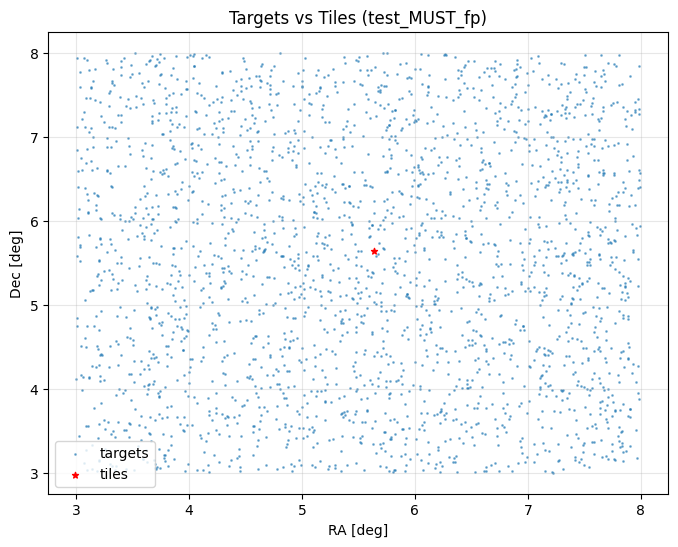

In [ ]:
from pathlib import Path
import glob
from pathlib import Path
from test_MUST_fp import *



# =========================
# 测试 test_MUST_fp.py 中新整理的画图函数
# =========================
target_file = Path('/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-targets-0001.fits')
tiles_file = Path('/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits')
single_fba_file = Path('/home/hmf/work/FA_test/data/random/Nrepet_test/output/iter00000001.fits')
fba_files = sorted(glob.glob('/home/hmf/work/FA_test/data/random/Nrepet_test/output/iter0*.fits'))

# target_init = "/home/hmf/work/FA_test/data/random/targets_exdense_box5_00_10000.fits"
# output_dir = "/home/hmf/work/FA_test/output/MUST_FP_test"
# footprint = "/home/hmf/work/FA_test/data/random/Nrepet_test/tertiary-tiles-0001.fits"
# run_time = '2026-04-13T13:23:00+00:00'



for path in [target_file, tiles_file, single_fba_file]:
    print(path)
    assert path.exists(), path

assert len(fba_files) > 0, 'No fiberassign files found for plotting test.'
print('n_fba_files =', len(fba_files))

# 1. targets vs tiles
target = Table.read(target_file)
tiles = Table.read(tiles_file)
plot_targets_vs_tiles(target, tiles, sample_step=100, title='Targets vs Tiles (test_MUST_fp)')




(<Figure size 1200x1200 with 1 Axes>,
 <Axes: title={'center': 'Single Tile Assignment View (test_MUST_fp)'}, xlabel='RA', ylabel='DEC'>)

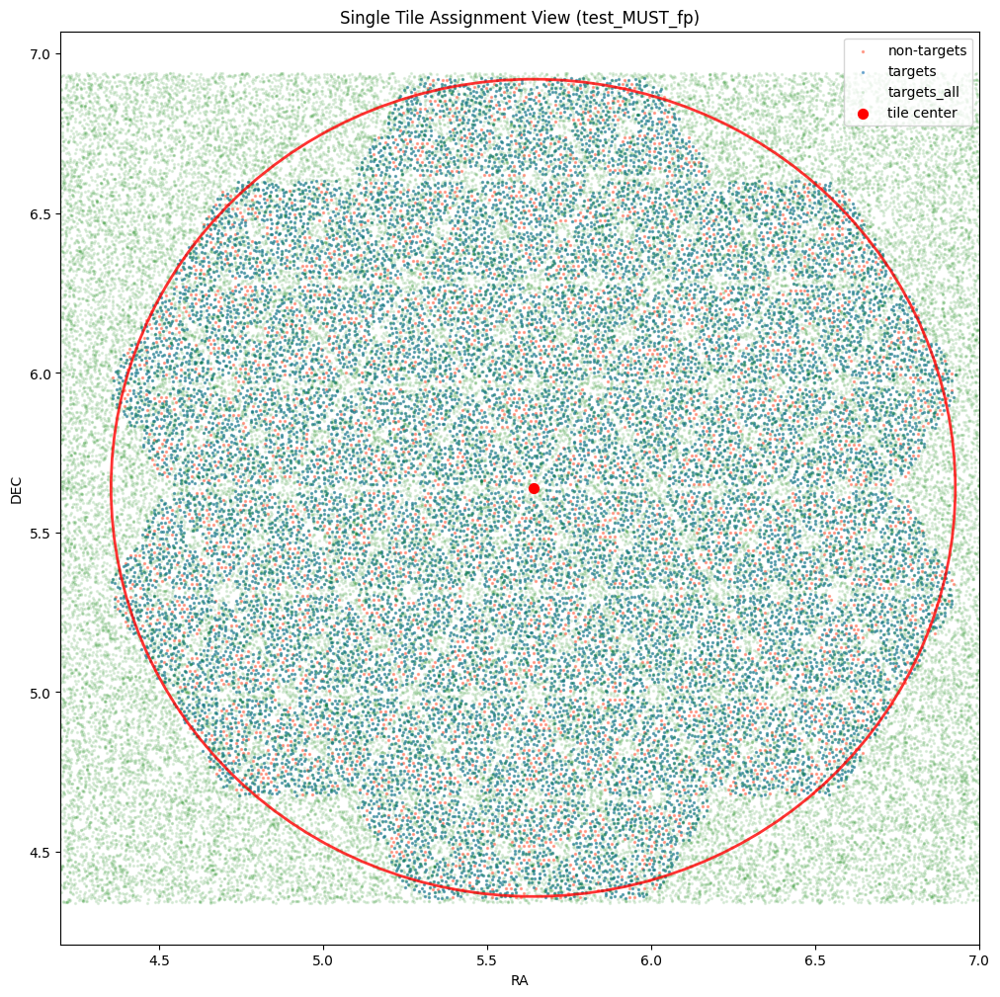

In [4]:
# 2. single tile assignment view
fba_res = Table.read(single_fba_file)
tile_ra, tile_dec = read_tile_center_from_fits(single_fba_file)
plot_fba_tile_view(
    fba_res,
    tile_ra=tile_ra,
    tile_dec=tile_dec,
    background_target=target,
    background_window=(2.3, 1.3),
    wrap_center=0,
    figsize=(12, 12),
    xlim=(4.2, 7),
    title='Single Tile Assignment View (test_MUST_fp)',
)


# plot fba res


===== Test 1: auto hw =====
Loading hardware (slow)...
Loading focalplane data from /home/hmf/work/FA_test/desi/data/focalplane
INFO: Loaded focalplane for time stamp 2026-04-15 16:37:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken


Total assigned targets: 1.0
{'n_rows': 40345, 'n_unique': 40345, 'unique_fraction': 1.0}
Final target count: 89001 40345


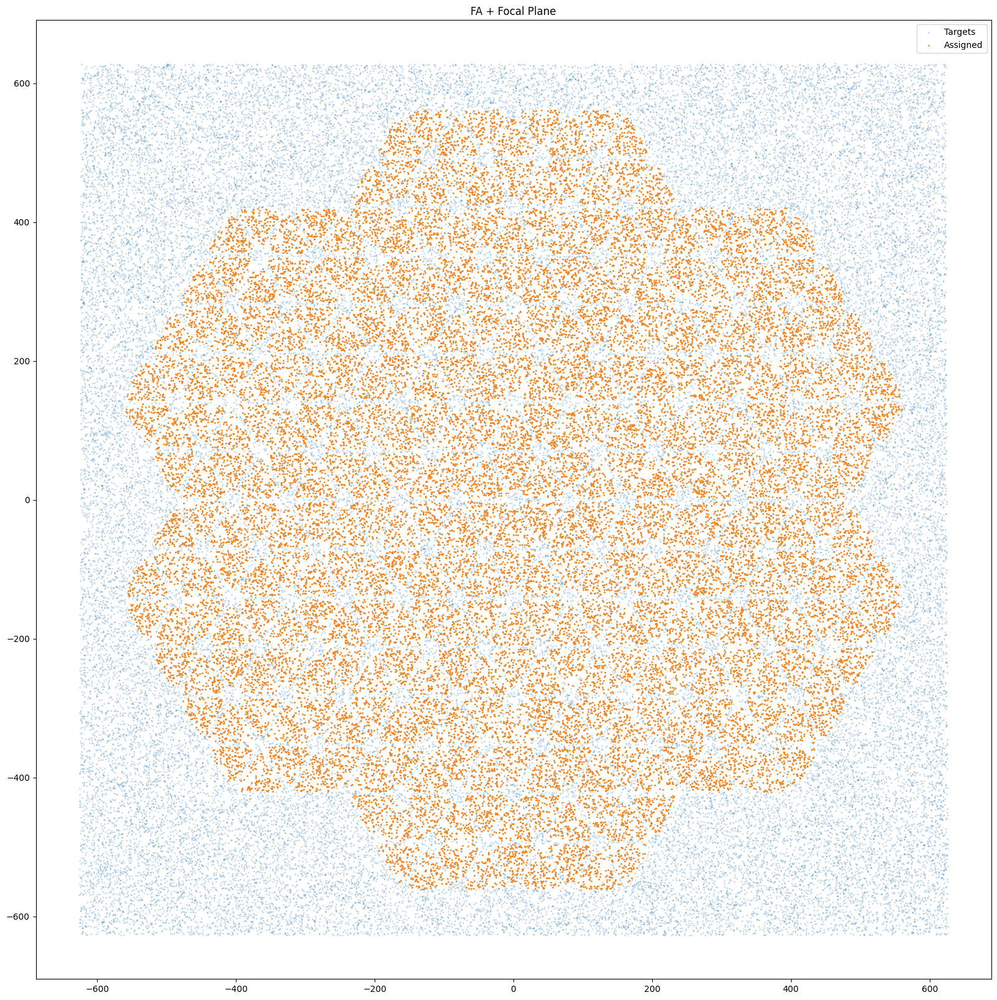

Time (auto hw): 68.07 s


In [ ]:

# 3. multiple tiles overlay
# plot_multiple_fba_tiles(fba_files[0:1], wrap_center=0, figsize=(18, 14), background_target = target)
import time
import os
from astropy.table import Table

# =========================
# 1. 配置路径
# =========================
# target_file = '/home/hmf/work/FA_test/data/random/targets_exdense_box5_00_10000.fits'
# fa_pattern  = '/home/hmf/work/FA_test/output/MUST_FP_test/2026-04-13T13:23:00+00:00/targets_exdense_box5_00_10000/iter*.fits'
# ply_file    = '/home/hmf/work/FA_test/data/focalplane_ply/2026-04-13T13:23:00+00:00_module_edges.ply'


target_file = "/home/hmf/work/FA_test/data/random/targets_exdense_box10.000_00_10000.0.fits"
run_time = '2026-04-15T16:37:00+00:00'# '2026-04-13T13:23:00+00:00'
fa_pattern = f"/home/hmf/work/FA_test/output/MUST_FP_test/{run_time}/{os.path.basename(target_file).replace('.fits', '')}/iter*.fits"
ply_file    = '/home/hmf/work/FA_test/data/focalplane_ply/2025-10-27T17:01:02+00:00_module_edges.ply'


n_iter = 10


# =========================
# 2. 单次运行（自动加载 hw）
# =========================
print("\n===== Test 1: auto hw =====")
t0 = time.time()

fig, ax, stats, hw, ra_t_xy, dec_t_xy, ra_f_xy, dec_f_xy = plot_fa_on_focalplane_auto(
    target_file=target_file,
    fa_pattern=fa_pattern,
    ply_file=ply_file,
    # hw=hw ,  # 自动加载
    only_inside= False,
    return_cat = True,
    # plot_FP = True
)

t1 = time.time()
print(f"Time (auto hw): {t1 - t0:.2f} s")




/tmp/ipykernel_2648722/4163595362.py:86: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


(<Figure size 3000x1500 with 2 Axes>,
 <Axes: title={'center': 'Sky Completeness Map (test_MUST_fp)'}, xlabel='RA [deg]', ylabel='DEC [deg]'>)

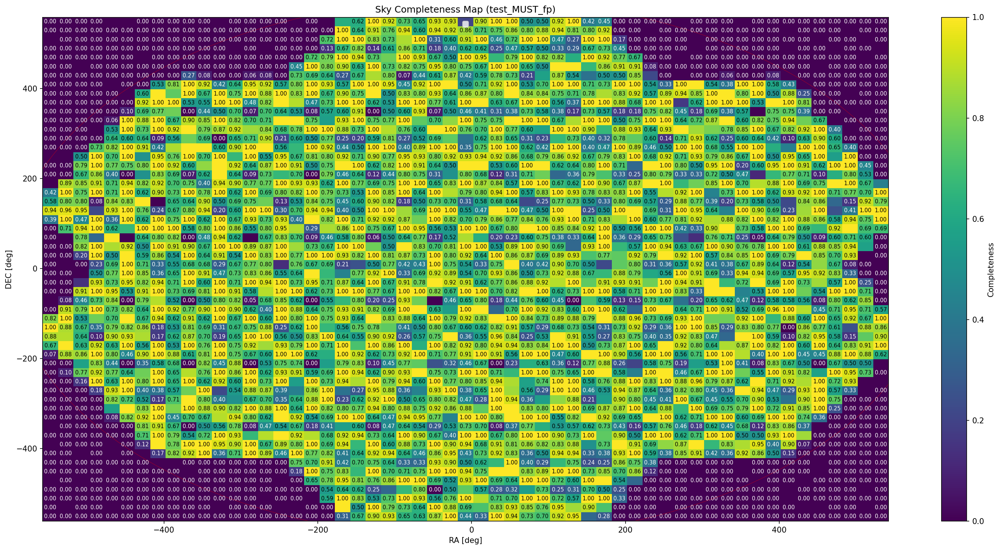

In [10]:

# # 4. sky completeness map

# fba_files = glob.glob(fa_pattern)
# print('fba_files:', len(fba_files))
# fa_all, fa_unique, stats = collect_unique_assignments(fba_files, keep_assigned_only=True)
# print(stats)
# ra_t = wrap_ra(target['RA'], center=180)
# dec_t = np.asarray(target['DEC'])
# ra_f = wrap_ra(fa_unique['TARGET_RA'], center=180)
# dec_f = np.asarray(fa_unique['TARGET_DEC'])


sky_grid = compute_completeness_grid(
    (ra_t_xy, dec_t_xy),
    (ra_f_xy, dec_f_xy),
    np.arange(min(ra_f_xy), max(ra_f_xy), 20),
    np.arange(min(dec_f_xy), max(dec_f_xy), 20),
)
# tile_centers = list(zip(wrap_ra(tiles['RA'], center=180), np.asarray(tiles['DEC'])))
tile_centers = [[0, 0]]


plot_completeness_map(
    sky_grid,
    tile_centers=tile_centers,
    tile_radius=600,
    figsize=(20, 10),
    title='Sky Completeness Map (test_MUST_fp)',
)


INFO: Loaded focalplane for time stamp 2026-04-13 13:23:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken


(<Figure size 2700x2100 with 2 Axes>,
 <Axes: title={'center': 'Focal Plane Completeness Map (test_MUST_fp)'}, xlabel='X [mm]', ylabel='Y [mm]'>)

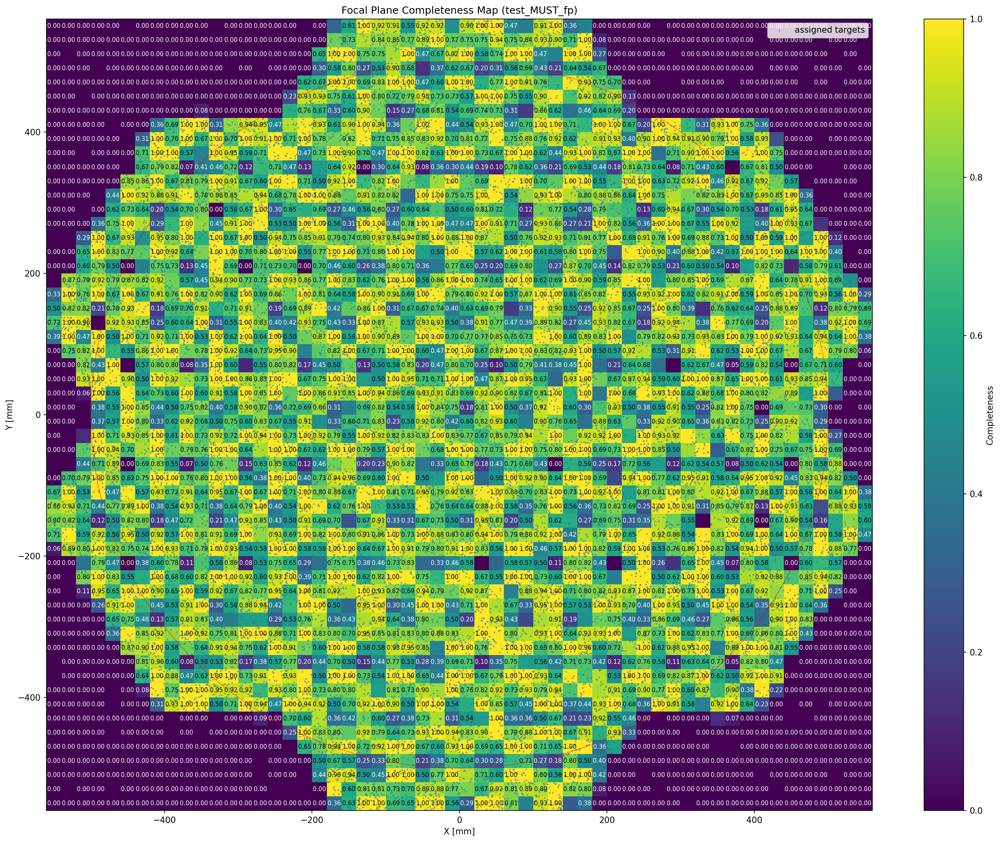

In [ ]:

# # 5. focal plane completeness map + completeness_ply


single_fba_file = fba_files = glob.glob(fa_pattern)[0]
header, _, _, _, _ = read_assignment_fits_tile(str(single_fba_file))

hw = get_hw(str(single_fba_file))
tile_ra = header['TILERA']
tile_dec = header['TILEDEC']
tile_theta = header['FIELDROT']
tile_obstime = header['FA_PLAN']
tile_obsha = header['FA_HA']
T_x, T_y = ra_t_xy, dec_t_xy 
A_x, A_y = ra_f_xy, dec_f_xy
# T_x, T_y = radec2xy(
#     hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
#     target['RA'], target['DEC'], use_cs5=True,
# )
# A_x, A_y = radec2xy(
#     hw, tile_ra, tile_dec, tile_obstime, tile_theta, tile_obsha,
#     fa_unique['TARGET_RA'], fa_unique['TARGET_DEC'], use_cs5=True,
# )
fp_grid = compute_completeness_grid(
    (T_x, T_y),
    (A_x, A_y),
    np.arange(-560, 580, 20),
    np.arange(-560, 580, 20),
)
plot_completeness_map(
    fp_grid,
    tile_centers=[(0, 0)],
    tile_radius=500,
    figsize=(18, 14),
    scatter_points=(A_x, A_y),
    circle_kwargs={'alpha': 0.8},
    title='Focal Plane Completeness Map (test_MUST_fp)',
    xlabel='X [mm]',
    ylabel='Y [mm]',
)



INFO: Loaded focalplane for time stamp 2026-04-13 13:23:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken
Total assigned targets: 1.0
{'n_rows': 14296, 'n_unique': 14296, 'unique_fraction': 1.0}


completeness ply: 0.45102549357868504 num: 26085
completeness all: 0.33265828677839854 42960.0
Total assigned targets: 1.0
{'n_rows': 21182, 'n_unique': 21182, 'unique_fraction': 1.0}


completeness ply: 0.6678550891316849 num: 26085
completeness all: 0.4928072625698324 42960.0
Total assigned targets: 1.0
{'n_rows': 23527, 'n_unique': 23527, 'unique_fraction': 1.0}


completeness ply: 0.7416906267970098 num: 26085
completeness all: 0.5473463687150838 42960.0
Total assigned targets: 1.0
{'n_rows': 24119, 'n_unique': 24119, 'unique_fraction': 1.0}


completeness ply: 0.7603986965689093 num: 26085
completeness all: 0.5611033519553073 42960.0
Total assigned targets: 1.0
{'n_rows': 24263, 'n_unique': 24263, 'unique_fraction': 1.0}


completeness ply: 0.7648840329691393 num: 26085
completeness all: 0.5644553072625699 42960.0
Total assigned targets: 1.0
{'n_rows': 24287, 'n_unique': 24287, 'unique_fraction': 1.0}


completeness ply: 0.7657657657657657 num: 26085
completeness all: 0.5650139664804469 42960.0
Total assigned targets: 1.0
{'n_rows': 24292, 'n_unique': 24292, 'unique_fraction': 1.0}


completeness ply: 0.7659574468085106 num: 26085
completeness all: 0.5651303538175046 42960.0


(<Figure size 640x480 with 1 Axes>,
 <Axes: xlabel='N_pass', ylabel='completeness'>)

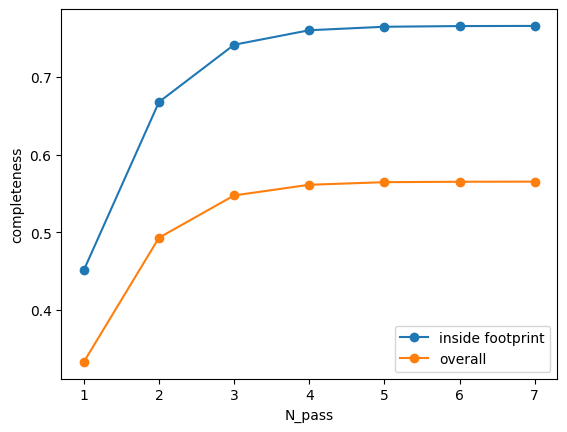

In [12]:
fba_files = glob.glob(f"/home/hmf/work/FA_test/output/MUST_FP_test/{run_time}/{os.path.basename(target_file).replace('.fits', '')}/iter*.fits")
hw = get_hw(str(single_fba_file))
com_list = [
    completeness_ply(
        T_x,
        T_y,
        fa_files = fba_files[: i + 1],
        hw = hw
    )
    for i in range(len(fba_files))
]
plot_completeness_curve(
    range(1, len(com_list) + 1),
    com_list,
    labels=('inside footprint', 'overall'),
)

INFO: Loaded focalplane for time stamp 2025-10-27 17:01:02+00:00
INFO: Focalplane has 0 fibers that are stuck or broken

===== BASIC INFO =====
run_date: 2025-10-27T17:01:02+00:00
number of modules: 336

===== SHAPE INFO =====
module id: 0
type(shape): <class 'fiberassign._internal.Shape'>
available attributes:
['axis', 'circles', 'rotation', 'rotation_origin', 'segments', 'transl']

===== SEGMENTS INFO =====
number of segments: 1
type(segment): <class 'fiberassign._internal.Segments'>
segment attributes:
['points', 'rotation', 'transl']

first segment points (first 5):
(-474.0879401076759, 124.0981831264578)
(-463.1260598923242, 124.09818312645778)
(-436.4951197846484, 77.97204180663942)
(-441.9760598923242, 68.47877506690281)
(-495.2379401076759, 68.47877506690281)

===== PLOTTING SEGMENTS =====


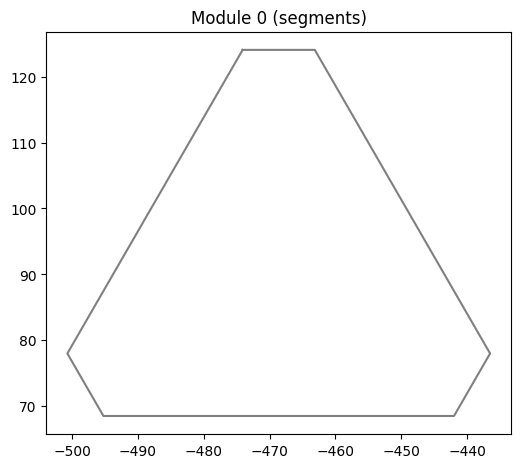


===== DEBUG DONE =====


In [14]:
import os
os.environ['DESIMODEL'] = os.path.expanduser('~/work/FA_test/desi')

import sys
import numpy as np
import matplotlib.pyplot as plt
from fiberassign.hardware import load_hardware
from fiberassign.assign import read_assignment_fits_tile


# =========================
# Step 0: 读取输入
# =========================
# infile = '/home/hmf/work/FA_test/output/MUST_FP_test/2026-04-13T13:23:00+00:00/targets_exdense_box5_00_10000/iter00000001.fits'
infile = '/home/hmf/work/FA_test/output/tiles_box10_1visit_10000010.fits'
header, fiber_data, targets_data, avail_data, gfa_data = \
    read_assignment_fits_tile(infile)

run_date = header["FA_RUN"]

margins = {}
for key in ['pos', 'gfa', 'module']:
    hdrkey = "FA_M_%s" % key[:3]
    if hdrkey in header:
        margins[key] = header[hdrkey]

hw = load_hardware(rundate=run_date, add_margins=margins)

print("\n===== BASIC INFO =====")
print("run_date:", run_date)
print("number of modules:", len(hw.mod_module_excl))


# =========================
# Step 1: 选一个 module
# =========================
mod_id = list(hw.mod_module_excl.keys())[0]
shape = hw.mod_module_excl[mod_id]

print("\n===== SHAPE INFO =====")
print("module id:", mod_id)
print("type(shape):", type(shape))
print("available attributes:")
print([a for a in dir(shape) if not a.startswith("_")])


# =========================
# Step 2: 检查 segments
# =========================
if hasattr(shape, "segments"):
    print("\n===== SEGMENTS INFO =====")
    print("number of segments:", len(shape.segments))

    seg0 = shape.segments[0]
    print("type(segment):", type(seg0))
    print("segment attributes:")
    print([a for a in dir(seg0) if not a.startswith("_")])

    # 打印前几个点
    if hasattr(seg0, "points"):
        print("\nfirst segment points (first 5):")
        for p in seg0.points[:5]:
            print(p)


# =========================
# Step 3: 检查是否有 boundary / loops
# =========================
for attr in ["boundaries", "loops", "polygons"]:
    if hasattr(shape, attr):
        print(f"\n===== FOUND {attr.upper()} =====")
        obj = getattr(shape, attr)
        print(f"{attr} length:", len(obj))

        # 打印第一个 polygon
        first = obj[0]
        print("type:", type(first))
        print("first few points:")
        try:
            for p in first[:5]:
                print(p)
        except:
            print("cannot iterate directly")


# =========================
# Step 4: 可视化 segments（关键！）
# =========================
print("\n===== PLOTTING SEGMENTS =====")

plt.figure(figsize=(6,6))

if hasattr(shape, "segments"):
    for seg in shape.segments:
        if hasattr(seg, "points"):
            xs = []
            ys = []
            for p in seg.points:
                try:
                    x, y = p[0], p[1]
                except:
                    x, y = p.x, p.y
                xs.append(x)
                ys.append(y)

            plt.plot(xs, ys, '-k', alpha=0.5)

plt.title(f"Module {mod_id} (segments)")
plt.gca().set_aspect('equal')
plt.show()


# =========================
# Step 5: 尝试画 boundary（如果存在）
# =========================
if hasattr(shape, "boundaries"):
    print("\n===== PLOTTING BOUNDARIES =====")
    plt.figure(figsize=(6,6))

    for boundary in shape.boundaries:
        xs = []
        ys = []
        for p in boundary:
            try:
                x, y = p[0], p[1]
            except:
                x, y = p.x, p.y
            xs.append(x)
            ys.append(y)

        plt.plot(xs, ys, '-r')

    plt.title(f"Module {mod_id} (boundaries)")
    plt.gca().set_aspect('equal')
    plt.show()


print("\n===== DEBUG DONE =====")

In [23]:
print(shape.segments)
for seg in shape.segments:
    print(seg.points)
print(shape_new.segments)
for seg in shape_new.segments:
    print(seg.points)

print(hw.mod_module_excl)

[<fiberassign.Segments 7 points>]
[(-474.0879401076759, 124.0981831264578), (-463.1260598923242, 124.09818312645778), (-436.4951197846484, 77.97204180663942), (-441.9760598923242, 68.47877506690281), (-495.2379401076759, 68.47877506690281), (-500.7188802153517, 77.97204180663942), (-474.0879401076759, 124.0981831264578)]
[<fiberassign.Segments 17 points>]
[(-487.8365361365901, 126.39433812645781), (-488.3176436697736, 125.2328417948863), (-488.42656341576793, 124.40551418629329), (-488.3176436697737, 123.57818657770027), (-487.78978684976465, 122.30382748384321), (-489.1573426085931, 122.12378535260345), (-489.928289207884, 121.80444881531169), (-490.59031606118066, 121.2964577440104), (-491.43001499999997, 120.20214078139317), (-492.26971393881934, 121.29645774401038), (-492.931740792116, 121.8044488153117), (-493.7026873914069, 122.12378535260343), (-494.530015, 122.23270509859769), (-494.81092224910077, 122.1957229576632), (-495.04405289097565, 122.75855011508195), (-492.94492970389

In [22]:
# =========================
# Step 0: 读取输入
# =========================
infile = '/home/hmf/work/FA_test/output/MUST_FP_test/2026-04-13T13:23:00+00:00/targets_exdense_box5_00_10000/iter00000001.fits'
# infile = '/home/hmf/work/FA_test/output/tiles_box10_1visit_10000010.fits'
header, fiber_data, targets_data, avail_data, gfa_data = \
    read_assignment_fits_tile(infile)

run_date = header["FA_RUN"]

margins = {}
for key in ['pos', 'gfa', 'module']:
    hdrkey = "FA_M_%s" % key[:3]
    if hdrkey in header:
        margins[key] = header[hdrkey]


hw_new = load_hardware(rundate=run_date, add_margins=margins)

print("\n===== BASIC INFO =====")
print("run_date:", run_date)
print("number of modules:", len(hw.mod_module_excl))


# =========================
# Step 1: 选一个 module
# =========================
mod_id_new = list(hw_new.mod_module_excl.keys())[0]
shape_new = hw_new.mod_module_excl[mod_id_new]

print("\n===== SHAPE INFO =====")
print("module id:", mod_id_new)
print("type(shape):", type(shape_new))
print("available attributes:")
print([a for a in dir(shape_new) if not a.startswith("_")])

INFO: Loaded focalplane for time stamp 2026-04-13 13:23:00+00:00
INFO: Focalplane has 0 fibers that are stuck or broken

===== BASIC INFO =====
run_date: 2026-04-13T13:23:00+00:00
number of modules: 336

===== SHAPE INFO =====
module id: 0
type(shape): <class 'fiberassign._internal.Shape'>
available attributes:
['axis', 'circles', 'rotation', 'rotation_origin', 'segments', 'transl']


NameError: name 'fba_files' is not defined

# check focal plane

 保存 segments.ply...
 提取外边界...
 保存 outer_boundary.ply...
 绘图...


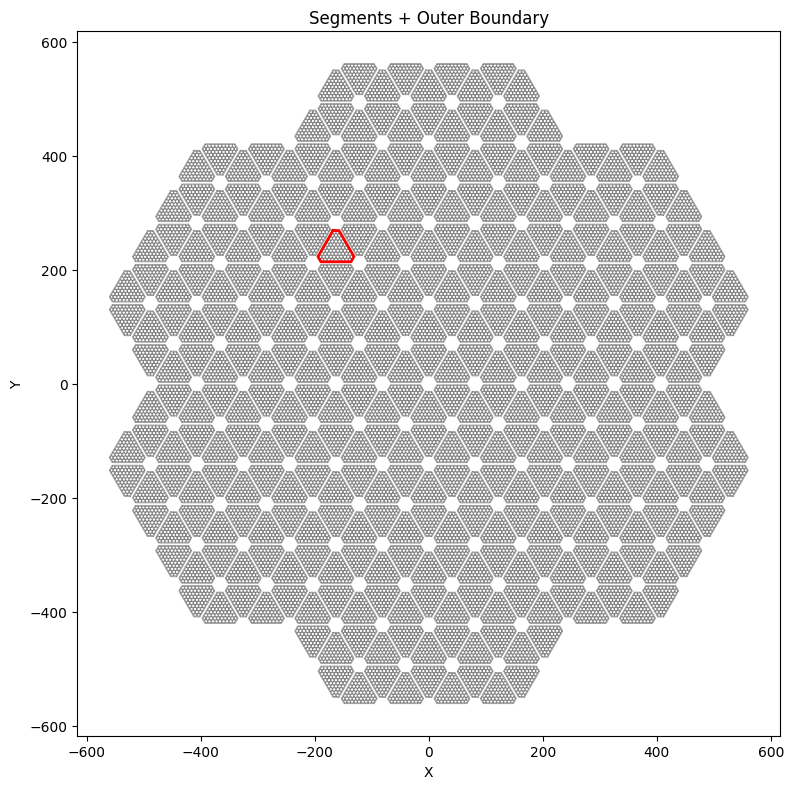

 完成！


In [3]:
import sys
sys.path.append('/home/hmf/work/software/must_fbautil-main/python/')
from utils import *
import ezdxf
import glob
from shapely.geometry import LineString
from shapely.ops import unary_union, snap, polygonize 

def plotconfig_xy(ax=None):
    if ax is None: ax = plt.gca()
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_aspect('equal')
    ax.figure.tight_layout()
def get_dxf_points(fname):
    doc = ezdxf.readfile(fname)
    msp = doc.modelspace()
    segments = []
    for e in msp:
        with e.points() as points: # [(x, y, start_width, end_width, bulge), ...]
            #print(e, len(points))
            xy = np.array(points).T[:2] # (2, npoints)
            segments.append(xy)
    return segments # [[[x, ...], [y, ...]], ...]

from steputils import p21
def get_step_points(fname):
    pass

def plot_segments(segments):
    fig, ax = plt.subplots(figsize=(10, 10))
    for xy in segments:
        ax.plot(*xy, '-')
        #ax.plot(*xy[:, 0], 'ks')
        #ax.plot(*xy[:, 1], 'rs')
    plotconfig_xy(ax)
    plt.show()
# =========================
# 保存 segments → PLY
# =========================
def save_segments_to_ply(segments, filename):
    vertices = []
    edges = []
    vid = 0

    for seg in segments:
        pts = seg.T
        n = len(pts)

        pts3d = np.hstack([pts, np.zeros((n, 1))])
        vertices.extend(pts3d)

        for i in range(n - 1):
            edges.append([vid + i, vid + i + 1])

        vid += n

    vertices = np.array(vertices)
    edges = np.array(edges)

    with open(filename, 'w') as f:
        f.write("ply\nformat ascii 1.0\n")
        f.write(f"element vertex {len(vertices)}\n")
        f.write("property float x\nproperty float y\nproperty float z\n")
        f.write(f"element edge {len(edges)}\n")
        f.write("property int vertex1\nproperty int vertex2\n")
        f.write("end_header\n")

        for v in vertices:
            f.write(f"{v[0]} {v[1]} {v[2]}\n")

        for e in edges:
            f.write(f"{e[0]} {e[1]}\n")


# =========================
# 提取外边界
# =========================
def get_outer_boundary(segments, tol=1e-6):
    lines = []

    for seg in segments:
        pts = seg.T
        if len(pts) > 1:
            lines.append(LineString(pts))

    # 合并
    merged = unary_union(lines)

    # 修复缝隙（关键）
    merged = snap(merged, merged, tol)

    # polygonize
    polys = list(polygonize(merged))

    if len(polys) == 0:
        raise RuntimeError("❌ 无法生成闭合区域，请检查 DXF 是否闭合")

    # 取最大 polygon
    outer = max(polys, key=lambda p: p.area)

    return np.array(outer.exterior.coords)


# =========================
# 保存 boundary → PLY
# =========================
def save_boundary_to_ply(boundary, filename):
    n = len(boundary)

    vertices = np.hstack([boundary, np.zeros((n, 1))])
    edges = [[i, (i + 1) % n] for i in range(n)]

    with open(filename, 'w') as f:
        f.write("ply\nformat ascii 1.0\n")
        f.write(f"element vertex {n}\n")
        f.write("property float x\nproperty float y\nproperty float z\n")
        f.write(f"element edge {n}\n")
        f.write("property int vertex1\nproperty int vertex2\n")
        f.write("end_header\n")

        for v in vertices:
            f.write(f"{v[0]} {v[1]} {v[2]}\n")

        for e in edges:
            f.write(f"{e[0]} {e[1]}\n")


# =========================
# 可视化
# =========================
def plot_all(segments, boundary):
    fig, ax = plt.subplots(figsize=(8, 8))

    # 所有 segments（灰色）
    for seg in segments:
        ax.plot(seg[0], seg[1], color='gray', linewidth=0.5)

    # 外轮廓（红色）
    ax.plot(boundary[:, 0], boundary[:, 1], color='red', linewidth=2)

    ax.set_aspect('equal')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_title('Segments + Outer Boundary')
    plt.tight_layout()
    plt.show()


if __name__=='__main__':
    actions = ['plot_dxf']
    if 'plot_dxf' in actions:
        fname = glob.glob('/home/hmf/work/FA_test/MUST_FP/2026.04.15/Framed-GlobalGap4.4mm-ModuleWalls/2026-04-27*.dxf')[0]
        segments = get_dxf_points(fname)

        print(" 保存 segments.ply...")
        save_segments_to_ply(segments[-336:], "segments.ply")

        print(" 提取外边界...")
        boundary = get_outer_boundary(segments[-336:])

        print(" 保存 outer_boundary.ply...")
        save_boundary_to_ply(boundary, "outer_boundary.ply")

        print(" 绘图...")
        plot_all(segments, boundary)

        print(" 完成！")


In [1]:
import sys
sys.path.append('/home/hmf/work/software/must_fbautil-main/python/')
from utils import *
import ezdxf
import glob
def plotconfig_xy(ax=None):
    if ax is None: ax = plt.gca()
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_aspect('equal')
    ax.figure.tight_layout()
def get_dxf_points(fname):
    doc = ezdxf.readfile(fname)
    msp = doc.modelspace()
    segments = []
    for e in msp:
        with e.points() as points: # [(x, y, start_width, end_width, bulge), ...]
            #print(e, len(points))
            xy = np.array(points).T[:2] # (2, npoints)
            segments.append(xy)
    return segments # [[[x, ...], [y, ...]], ...]

from steputils import p21
def get_step_points(fname):
    pass

def plot_segments(segments):
    fig, ax = plt.subplots(figsize=(10, 10))
    for xy in segments:
        ax.plot(*xy, '-')
        #ax.plot(*xy[:, 0], 'ks')
        #ax.plot(*xy[:, 1], 'rs')
    plotconfig_xy(ax)
    plt.show()

if __name__=='__main__':
    actions = ['plot_dxf']
    if 'plot_dxf' in actions:
        fname = glob.glob('/home/hmf/work/FA_test/MUST_FP/2026.04.15/Framed-GlobalGap4.4mm-ModuleWalls/2026-04-27*.dxf')[0]
        segments = get_dxf_points(fname)
        

    if 'plot_step' in actions:
        fname = '/home/hmf/work/software/must_fbautil-main/data/focalplane/coordinate_system_and_3D_model/Polygonal_model_current_prototype.STEP'

plot_segments(segments[:160])

NameError: name 'np' is not defined